# [DCF](https://github.com/astronomerdamo/pydcf)

The reported correlation relates to the first time series. That is, how the first time series should be shifted to match the second, ie: ts2 = ts1 - correlation. Positive correlation is ts1 leading ts2, negative correlation is ts1 lagging ts2.

In [ ]:
general Guidelines for Choosing Bin Width
Start with a larger bin size and work down to smaller scales as opposed to small first.
Never choose a bin width below the average time resolution of your data - I haven't implemented a check for this yet so the onus on you.
Good starting spot might be ~ 10x average time resolution of your data.
For example, if the worst resolution time series if 5 seconds start with 50 second bin width.
Larger bin width could also benefit from a Gaussian weighting scheme to help initially explore the data.
Additional Settings
Optional arguments may be passed to dcf.py:

-w=[slot, gauss] : corresponds to the weighting of the matching pairs. Default behaviour is 'slot'.
-p=[0,1,2] : the order of the polynomial to be fit and subtracted from the time series. Default is '0'.
-np --no-plot : By default dcf.py plots the results in a matplotlib.pyplot window, disable this by including flag.
-o --output : By default dcf.py does not write any information to file. If you would like a plain text, single comma delimited output file include this flag. Spits out 'dcf_output.csv' in the current working directory.
-v --verbose : By default dcf.py operates silently, if you are curious or a control freak use this flag.

# CCF

In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import ccf
 
x = pd.read_excel('resample.xls',index_col=0,date_parse=True)
ccf_x = ccf(x=x.values.ravel(),y=x.values.ravel())
print('CCF:\n',ccf_x[:10])

In [1]:
from pylab import *
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyfits


from matplotlib.ticker import NullFormatter  # useful for `logit` scale
from astropy.time import Time

from astropy.stats import LombScargle
plt.style.use('seaborn-whitegrid')

%matplotlib inline
%config InlineBackend.figure_format='svg'
#%config InlineBackend.figure_format='retina'

In [2]:
                                                        
def convert_xaxis_mjd(time):
    return Time(time).mjd   

def convert_xaxis_time(mjd):
    return Time(mjd,format='mjd').to_datetime()



def date2yday(x):
    """
    x is in matplotlib datenums, so they are floats.
    """
    y = x - mdates.date2num(datetime.datetime(2018, 1, 1))+58119
    return y


def yday2date(x):
    """
    return a matplotlib datenum (x is days since start of year)
    """
    y = x + mdates.date2num(datetime.datetime(2018, 1, 1))
    return y


def mjd2date(x):
    y = x + mdates.date2num(datetime.datetime(2007, 1, 1))
    return y

def date2mjd(x):    
    y = x - mdates.date2num(datetime.datetime(2007, 1, 1))+54101
    return y 



def convert_partial_year(numbers):
    datetimes=[]
    for number in numbers:
        year = int(number)
        d = timedelta(days=(number - year)*(365 + is_leap(year)))
        day_one = datetime(year,1,1)
        date = d + day_one
        datetimes.append(date)
    return datetimes


def is_leap(year):
    if not year%4 and  year%100 or not year%400:
        return True
    return False


def convert_mjd(times):
    timesmjd=[]
    for i in times:
        timesmjd.append(Time(i).mjd)
    return timesmjd  


def convert_date(times):
    timesdate=[]
    for i in times:
        timesdate.append(Time(i,format='mjd').datetime)
    return timesdate

def convert_date_single(time):
    timedate=Time(time,format='mjd').datetime
    return timedate

# create example

In [332]:
size=1000
lag=np.pi/4
t1=np.arange(size)/50
t2=np.arange(size)/50
err1=0.1*np.random.rand(size)
err2=0.2*np.random.rand(size)
y1=20*np.sin(t1)+0.1*np.random.rand(size)
y2=50*np.sin(t1-lag)+4*np.random.rand(size)

In [333]:
data_my1=pd.DataFrame({'t':t1,'flux':y1,'err':err1},index=None,columns=['t','flux','err'])
data_my2=pd.DataFrame({'t':t2,'flux':y2,'err':err2},index=None,columns=['t','flux','err'])

data_my1.to_csv('example/dcf_t1.csv',index=False,header=False)
data_my2.to_csv('example/dcf_t2.csv',index=False,header=False)

data_my1,data_my2

mkdir example

## read_create_example

ts1_o=pd.read_csv('/Users/brettlv/timing_analysis/pydcf/example/ts1copy.csv',header=None)
ts2_o=pd.read_csv('/Users/brettlv/timing_analysis/pydcf/example/ts2copy.csv',header=None)

plt.errorbar(ts1_o[0],ts1_o[1],ts1_o[2],label='t1')
plt.errorbar(ts2_o[0],ts2_o[1],ts2_o[2],label='t2')
plt.legend()
#plt.xlim(0,50)
#plt.errorbar(ts2['0'],ts2['1'],ts2['2'])

# origin_example

ts1=pd.read_csv('/Users/brettlv/timing_analysis/pydcf/example/ts1.csv',header=None)
ts2=pd.read_csv('/Users/brettlv/timing_analysis/pydcf/example/ts2.csv',header=None)

plt.errorbar(ts1[0],ts1[1],ts1[2],label='t1')
plt.errorbar(ts2[0],ts2[1],ts2[2],label='t2')
plt.legend()
#plt.xlim(0,50)
#plt.errorbar(ts2['0'],ts2['1'],ts2['2'])

In [ ]:
pwd

The reported correlation relates to the first time series. That is, how the first time series should be shifted to match the second, ie: ts2 = ts1 - correlation. Positive correlation is ts1 leading ts2, negative correlation is ts1 lagging ts2.

## output origin_example

In [ ]:
%run dcf.py example/ts1.csv example/ts2.csv -100 100 1.0 -v -w=gauss -p=1 -o

# jd_to_mjd 
The MJD drops those first "24" digits. Thus, we have as a formula for converting from JD to MJD, MJD = JD - 2400000.5

# 3c273

In [ ]:
3C 273                         12h29m06.7s +02d03m09s QSO    >30000  0.158339 

## radio_sma

http://sma1.sma.hawaii.edu/callist/callist.html?data=1229%2B020

In [183]:
data_3c273_sma=pd.read_excel('/Users/brettlv/Downloads/3C273/3c273_sma.xlsx',sheet_name='Sheet2')#SMA
data_3c273_sma.columns=['BAND', 'UT_DATE_TIME', 'ins', 'F(GHz)', 'FLUX(JY)', '+/-', 'ERROR','FLUX_P.I.']
data_3c273_sma['mjd']=convert_mjd(data_3c273_sma['UT_DATE_TIME'])
data_3c273_1mm=data_3c273_sma[data_3c273_sma['BAND']=='1mm']
data_3c273_850=data_3c273_sma[data_3c273_sma['BAND']==850]

In [510]:
min(data_3c273_1mm['F(GHz)']),max(data_3c273_1mm['F(GHz)']),

(206.21, 293.93)

In [511]:
min(data_3c273_850['F(GHz)']),max(data_3c273_850['F(GHz)']),

(309.99, 406.04)

In [ ]:
data_3c273_sma.columns

In [184]:
dcf_sma_1mm=pd.DataFrame({'t':data_3c273_1mm['mjd'],'flux':data_3c273_1mm['FLUX(JY)'],'err':data_3c273_1mm['ERROR']},index=None,columns=['t','flux','err'])
dcf_sma_850=pd.DataFrame({'t':data_3c273_850['mjd'],'flux':data_3c273_850['FLUX(JY)'],'err':data_3c273_850['ERROR']},index=None,columns=['t','flux','err'])
dcf_sma_1mm.to_csv('/Users/brettlv/Downloads/3C273/dcf_sma_1mm.csv',index=False,header=False)
dcf_sma_850.to_csv('/Users/brettlv/Downloads/3C273/dcf_sma_850.csv',index=False,header=False)

rescale_flux_1mm=(dcf_sma_1mm['flux']-min(dcf_sma_1mm['flux']))/(max(dcf_sma_1mm['flux'])-min(dcf_sma_1mm['flux']))
rescale_err_1mm=dcf_sma_1mm['err']*rescale_flux_1mm/dcf_sma_1mm['flux']

rescale_flux_850=(dcf_sma_850['flux']-min(dcf_sma_850['flux']))/(max(dcf_sma_850['flux'])-min(dcf_sma_850['flux']))
rescale_err_850=dcf_sma_850['err']*rescale_flux_850/dcf_sma_850['flux']

dcf_sma_1mm_rescale=pd.DataFrame({'t':data_3c273_1mm['mjd'],'flux':rescale_flux_1mm,'err':rescale_err_1mm},index=None,columns=['t','flux','err'])
dcf_sma_850_rescale=pd.DataFrame({'t':data_3c273_850['mjd'],'flux':rescale_flux_850,'err':rescale_err_850},index=None,columns=['t','flux','err'])
dcf_sma_1mm_rescale.to_csv('/Users/brettlv/Downloads/3C273/dcf_sma_1mm_rescale.csv',index=False,header=False)
dcf_sma_850_rescale.to_csv('/Users/brettlv/Downloads/3C273/dcf_sma_850_rescale.csv',index=False,header=False)






<ErrorbarContainer object of 3 artists>

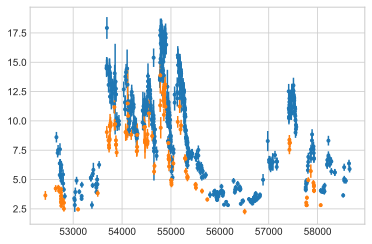

In [6]:
plt.errorbar(dcf_sma_1mm['t'],dcf_sma_1mm['flux'],dcf_sma_1mm['err'],fmt='.')
plt.errorbar(dcf_sma_850['t'],dcf_sma_850['flux'],dcf_sma_850['err'],fmt='.')

The reported correlation relates to the first time series. That is, how the first time series should be shifted to match the second, ie: ts2 = ts1 - correlation. Positive correlation is ts1 leading ts2, negative correlation is ts1 lagging ts2.

In [ ]:
1mm 0.85mm

In [ ]:
pwd

In [7]:
import os
os.chdir('/Users/brettlv/timing_analysis/pydcf')


    A simple implementation of the discrete correlation function (DCF)
    Author: Damien Robertson - robertsondamien@gmail.com

    Usage:
      $ python dcf.py -h for help and basic instruction



PYTHON SCRIPT: dcf3

INPUT TIMESERIES 1: /Users/brettlv/Downloads/3C273/dcf_sma_1mm.csv
INPUT TIMESERIES 2: /Users/brettlv/Downloads/3C273/dcf_sma_850.csv
LAG RANGE PROBED  : -500.0  :  500.0
LAG BIN WIDTH     : 1.0

Time series preparation
Quadratic De-trend Coefficients [a*x**2 + b*x + c]
a: -3.8753581455911195e-08
b: -0.0002866810834265349
c: 7.5077456667905915
Quadratic De-trend Coefficients [a*x**2 + b*x + c]
a: -4.873821035701058e-07
b: 0.002752392241402358
c: 2.9239782547214714

DCF INITIATED USING GAUSSIAN WEIGHTING
DCF COMPLETE
Writing DCF output file to: dcf_output.csv


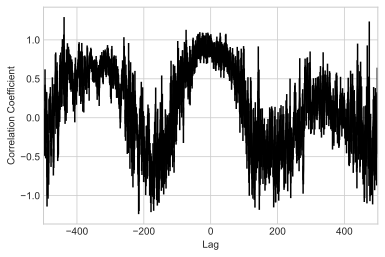

In [8]:
%run dcf.py /Users/brettlv/Downloads/3C273/dcf_sma_1mm.csv /Users/brettlv/Downloads/3C273/dcf_sma_850.csv -500 500 1.0 -v -w=gauss -p=2 -o

In [9]:
!mv dcf_output.csv dcf_sma_1mm_sma_850.csv


    A simple implementation of the discrete correlation function (DCF)
    Author: Damien Robertson - robertsondamien@gmail.com

    Usage:
      $ python dcf.py -h for help and basic instruction




/Users/brettlv/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:721: RuntimeWarning: divide by zero encountered in true_divide
  transform = 1.0 / sigma
/Users/brettlv/anaconda3/lib/python3.6/site-packages/scipy/optimize/minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


Writing DCF output file to: dcf_output.csv


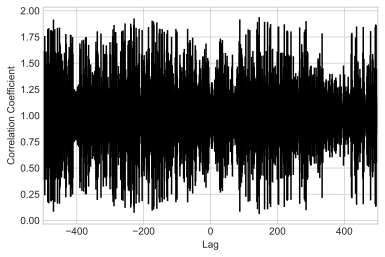

In [11]:
%run dcf.py /Users/brettlv/Downloads/3C273/dcf_sma_1mm_rescale.csv /Users/brettlv/Downloads/3C273/dcf_sma_850_rescale.csv -500 500 1.0 -w=gauss -p=2 -o

In [12]:
!mv dcf_output.csv dcf_sma_1mm_sma_850_rescale.csv

## pandas.read_html

pandas.read_html(io, match='.+', flavor=None, header=None, index_col=None, skiprows=None, attrs=None, parse_dates=False, tupleize_cols=None, thousands=', ', encoding=None, decimal='.', converters=None, na_values=None, keep_default_na=True, displayed_only=True)

## Vband

for q in range(10):
    i=q+1
    if q==0:
        R_3c273_phot_i=pd.read_html('http://james.as.arizona.edu/~psmith/Fermi/DATA/Objects/3c273_phot.html')
        R_3c273_phot_i[0].to_csv('/Users/brettlv/Downloads/3C273/Vband_%d.csv'%i)
    else:
        R_3c273_phot_i=pd.read_html('http://james.as.arizona.edu/~psmith/Fermi/DATA/Objects/3c273_phot_%d.html'%i)
        R_3c273_phot_i[0].to_csv('/Users/brettlv/Downloads/3C273/Vband_%d.csv'%i)      

data_V=pd.read_csv('/Users/brettlv/Downloads/3C273/Vband_1.csv',header=1)
data_V_select=data_V[data_V['Object']=='3C 273']
data_V_mjd_flux_err= data_V_select[{'JD','V','σ(V)'}]
data_V_mjd_flux_err['JD']=pd.to_numeric(data_V_mjd_flux_err['JD'], errors='coerce')
data_V_mjd_flux_err['mjd']=data_V_mjd_flux_err['JD']-2400000.5

In [13]:
data_V_all=pd.DataFrame()
for q in range(10):
    i=q+1
    data_V=pd.read_csv('/Users/brettlv/Downloads/3C273/Vband_%d.csv'%i,header=1)
    data_V_select=data_V[data_V['Object']=='3C 273']
    data_V_mjd_flux_err= data_V_select[{'JD','V','σ(V)'}]
    data_V_mjd_flux_err['JD']=pd.to_numeric(data_V_mjd_flux_err['JD'], errors='coerce')
    data_V_mjd_flux_err['V']=pd.to_numeric(data_V_mjd_flux_err['V'], errors='coerce')
    data_V_mjd_flux_err['σ(V)']=pd.to_numeric(data_V_mjd_flux_err['σ(V)'], errors='coerce')
    data_V_mjd_flux_err['mjd']=data_V_mjd_flux_err['JD']-2400000.5
    data_V_all=pd.concat([data_V_all,data_V_mjd_flux_err],ignore_index=True)
    

/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/

In [14]:
data_V_all.columns

Index(['σ(V)', 'V', 'JD', 'mjd'], dtype='object')

In [15]:
dcf_V_all=pd.DataFrame({'t':data_V_all['mjd'],'flux':data_V_all['V'],'err':data_V_all['σ(V)']},index=None,columns=['t','flux','err'])
dcf_V_all.to_csv('/Users/brettlv/Downloads/3C273/dcf_V_all.csv',index=False,header=False)

## Rband

for q in range(10):
    i=q+1
    R_3c273_phot_i=pd.read_html('http://james.as.arizona.edu/~psmith/Fermi/DATA/Objects/Rphot_Cycle%d.html'%i)
    R_3c273_phot_i[0].to_csv('/Users/brettlv/Downloads/3C273/Rband_%d.csv'%i)

In [16]:
data_R_all=pd.DataFrame()
for q in range(10):
    i=q+1
    data_R=pd.read_csv('/Users/brettlv/Downloads/3C273/Rband_%d.csv'%i,header=1)
    data_R_select=data_R[data_R['Object']=='3C 273']
    data_R_mjd_flux_err= data_R_select[{'JD','R','σ(R)'}]
    data_R_mjd_flux_err['JD']=pd.to_numeric(data_R_mjd_flux_err['JD'], errors='coerce')
    data_R_mjd_flux_err['R']=pd.to_numeric(data_R_mjd_flux_err['R'], errors='coerce')
    data_R_mjd_flux_err['σ(R)']=pd.to_numeric(data_R_mjd_flux_err['σ(R)'], errors='coerce')
    data_R_mjd_flux_err['mjd']=data_R_mjd_flux_err['JD']-2400000.5
    data_R_all=pd.concat([data_R_all,data_R_mjd_flux_err],ignore_index=True)

/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/

In [17]:
data_R_all.columns

Index(['σ(R)', 'R', 'JD', 'mjd'], dtype='object')

In [18]:
dcf_R_all=pd.DataFrame({'t':data_R_all['mjd'],'flux':data_R_all['R'],'err':data_R_all['σ(R)']},index=None,columns=['t','flux','err'])
dcf_R_all.to_csv('/Users/brettlv/Downloads/3C273/dcf_R_all.csv',index=False,header=False)

In [ ]:
len(data_R_all)

## smarts

In [507]:
data_smarts=pd.read_csv('/Users/brettlv/Downloads/3C273/3C273_smarts.csv')
data_smarts.columns

Index(['JD_start', 'B_JD_start', 'Bmag', 'Berr', 'V_JD_start', 'Vmag', 'Verr',
       'R_JD_start', 'Rmag', 'Rerr', 'J_JD_start', 'Jmag', 'Jerr',
       'K_JD_start', 'Kmag', 'Kerr'],
      dtype='object')

data_smarts_B=data_smarts[{'B_JD_start','Bmag','Berr'}]
data_smarts_V=data_smarts[{'V_JD_start','Vmag','Verr'}]
data_smarts_R=data_smarts[{'R_JD_start','Rmag','Rerr'}]
data_smarts_J=data_smarts[{'J_JD_start','Jmag','Jerr'}]
data_smarts_K=data_smarts[{'K_JD_start','Kmag','Kerr'}]

### plot_smarts

B_JD_start Bmag Berr
V_JD_start Vmag Verr
R_JD_start Rmag Rerr
J_JD_start Jmag Jerr
K_JD_start Kmag Kerr


Text(0.5, 0, 'MJD')

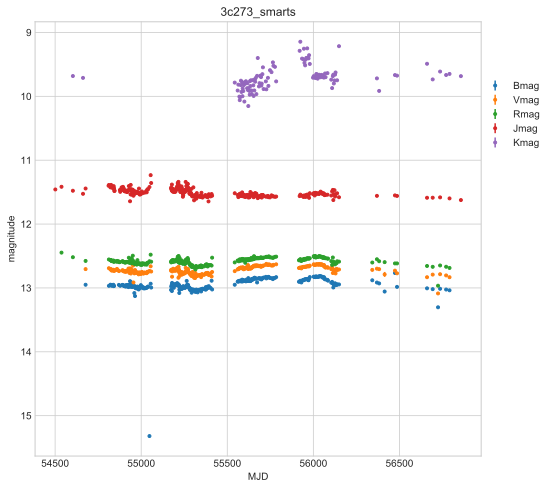

In [508]:
#plt.errorbar(data_gamma_day['t'],data_plot_gamma_day['flux'],data_plot_gamma_day['err'],fmt='.',label='gammaday')

fig, axs = plt.subplots(1, 1,figsize=(8,8))
axs.set_title('3c273_smarts')

for i in range(5):
    name_jd=data_smarts.columns[i*3+1]
    name_band=data_smarts.columns[i*3+2]
    name_err=data_smarts.columns[i*3+3]
    print(name_jd,name_band,name_err)
    data_band=data_smarts[data_smarts[name_jd]!=999.0]  
    axs.errorbar(data_band[name_jd]-2400000.5,data_band[name_band],data_band[name_err],fmt='.',label=name_band)

axs.set_ylabel('magnitude')    
axs.invert_yaxis()
axs.legend(loc=[1.0,0.7])
plt.xlabel('MJD')
#plt.semilogy()

In [ ]:
86400*7

## gamma

### gamma_day

In [ ]:
gamma_day_path='/Users/brettlv/Downloads/3C273/3C273_86400.lc'
lightcurve_day=pyfits.open(gamma_day_path)
#header=lightcurve_day[0].header
time_day=lightcurve_day[1].data['START']
count_day=lightcurve_day[1].data['FLUX_100_300000']
counterr_day=lightcurve_day[1].data['ERROR_100_300000']
during_day=lightcurve_day[1].data['DURATION']

lightcurve[1].header['MJDREFF']

lightcurve[1].data.columns

In [ ]:
t_day=time/86400+lightcurve_day[1].header['MJDREFI']+7.428703703703703e-4
y_day_rescale=(count_day-min(count_day))/(max(count_day)-min(count_day))# rescale to 0-1
err_day_rescale=(counterr_day*y_day_rescale/count_day)

dcf_data_gamma_day=pd.DataFrame({'t':t_day,'flux':count_day,'err':counterr_day},index=None,columns=['t','flux','err'])
dcf_data_gamma_day.to_csv('/Users/brettlv/Downloads/3C273/dcf_gamma3c273day.csv',index=False,header=False)

dcf_data_gamma_day_rescale=pd.DataFrame({'t':t_day,'flux':y_day_rescale,'err':err_day_rescale},index=None,columns=['t','flux','err'])
dcf_data_gamma_day_rescale.to_csv('/Users/brettlv/Downloads/3C273/dcf_gamma3c273day_rescale.csv',index=False,header=False)

### gamma_week

In [22]:
gamma_week_path='/Users/brettlv/Downloads/3C273/3C273_604800.lc'
lightcurve_week=pyfits.open(gamma_week_path)
#header=lightcurve_week[0].header
time_week=lightcurve_week[1].data['START']
count_week=lightcurve_week[1].data['FLUX_100_300000']
counterr_week=lightcurve_week[1].data['ERROR_100_300000']
during_week=lightcurve_week[1].data['DURATION']

lightcurve[1].data.columns

lightcurve[1].header['MJDREFF']
lightcurve[1].header

In [48]:
count_week

array([2.33794495e-07, 4.05899897e-07, 2.04005062e-07, 3.51421249e-07,
       7.31318437e-07, 9.32649414e-07, 1.10531437e-06, 8.22856350e-07,
       1.39993608e-06, 7.49286471e-07, 8.03889520e-07, 5.21689969e-07,
       6.73331783e-07, 6.16563227e-07, 6.48016453e-07, 3.79021770e-07,
       3.82078099e-07, 3.48933440e-07, 6.41481677e-07, 3.33721687e-07,
       2.42197331e-07, 2.30723586e-07, 2.17290079e-07, 1.99373787e-07,
       4.40758782e-07, 2.81029486e-07, 3.60276886e-07, 2.79151863e-07,
       1.82236974e-07, 3.30220644e-07, 3.80944584e-07, 3.58806375e-07,
       4.49875785e-07, 3.25566987e-07, 2.38915703e-07, 3.45280540e-07,
       6.67200936e-07, 1.03174796e-06, 7.79557809e-07, 6.52261861e-07,
       4.21677697e-07, 3.61556715e-07, 5.75561614e-07, 4.65094274e-07,
       2.47381848e-07, 2.54017351e-07, 2.01034013e-07, 6.06988806e-07,
       4.25737767e-07, 3.73537716e-07, 3.89796895e-07, 7.99716531e-07,
       1.30010585e-06, 1.17738011e-06, 3.13570808e-06, 1.60465515e-06,
      

In [175]:
t_week=time_week/86400+lightcurve_week[1].header['MJDREFI']+7.428703703703703e-4
y_week_rescale=(count_week-min(count_week))/(max(count_week)-min(count_week))# rescale to 0-1
err_week_rescale=(counterr_week*y_week_rescale/count_week)


data_gamma_week=pd.DataFrame({'t':t_week,'flux':count_week,'err':counterr_week},index=None,columns=['t','flux','err'])
dcf_data_gamma_week=pd.DataFrame({'t':t_week,'flux':count_week,'err':counterr_week},index=None,columns=['t','flux','err'])
dcf_data_gamma_week.to_csv('/Users/brettlv/Downloads/3C273/dcf_gamma3c273week.csv',index=False,header=False)

dcf_data_gamma_week_e7=pd.DataFrame({'t':t_week,'flux':count_week*1e7,'err':counterr_week*1e7},index=None,columns=['t','flux','err'])
dcf_data_gamma_week_e7.to_csv('/Users/brettlv/Downloads/3C273/dcf_e7_gamma3c273week.csv',index=False,header=False)


dcf_data_gamma_week_rescale=pd.DataFrame({'t':t_week,'flux':y_week_rescale,'err':err_week_rescale},index=None,columns=['t','flux','err'])
dcf_data_gamma_week_rescale.to_csv('/Users/brettlv/Downloads/3C273/dcf_gamma3c273week_rescale.csv',index=False,header=False)

### plot_fermi

## kim_2015-2019

In [ ]:
The blazar 3C 273 was observed at two radio bands (43 and ∼100GHz) and
gamma-ray (0.1-300GeV) during 2015-2019 on the VLBA, ALMA, and
Fermi-LAT telescopes. Three binning intervals (monthly, weekly, daily)
were used to generate the gamma-ray light curves. With the data
presented below, one can reproduce the light curves (Figure 1 & 2 of
the paper).

    	J/A+A/636/A62/alma	ALMA fluxes [timeSerie](light curve)timeSerie (147 rows)
    	J/A+A/636/A62/butot	VLBA (BU) total fluxes [timeSerie](light curve)timeSerie (40 rows)
    	J/A+A/636/A62/l7	LAT weekly fluxes [timeSerie](light curve)timeSerie (122 rows)
    	J/A+A/636/A62/l7ul	LAT weekly upper limits [timeSerie](light curve)timeSerie (78 rows)
    	J/A+A/636/A62/l30	LAT monthly fluxes [timeSerie](light curve)timeSerie (40 rows)
    	J/A+A/636/A62/l30ul	LAT monthly upper limits [timeSerie](light curve)timeSerie (7 rows)
    	J/A+A/636/A62/l1-16a	LAT daily fluxes during 2016A [timeSerie](light curve)timeSerie (63 rows)
    	J/A+A/636/A62/l1-16aul	LAT daily upper limits during 2016A [timeSerie](light curve)timeSerie (37 rows)
    	J/A+A/636/A62/l1-16b	LAT daily fluxes during 2016B [timeSerie](light curve)timeSerie (14 rows)
    	J/A+A/636/A62/l1-16bul	LAT daily upper limits during 2016B [timeSerie](light curve)timeSerie (85 rows)
    	J/A+A/636/A62/l1-17a	LAT daily fluxes during 2017A [timeSerie](light curve)timeSerie (24 rows)
    	J/A+A/636/A62/l1-17aul	LAT daily upper limits during 2017A [timeSerie](light curve)timeSerie (74 rows)

In [25]:
from astropy.io import ascii
data_kim_alma = pd.read_table("/Users/brettlv/Downloads/3C273/3C273kim_J_A+A_636_A62/alma.dat",header=None,delimiter='|')  
data_kim_butot = pd.read_table("/Users/brettlv/Downloads/3C273/3C273kim_J_A+A_636_A62/butot.dat",header=None,delimiter='|')  

/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:2: FutureWarning: read_table is deprecated, use read_csv instead.
  from ipykernel import kernelapp as app
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:3: FutureWarning: read_table is deprecated, use read_csv instead.
  app.launch_new_instance()


In [26]:
mjd_kim_alma=data_kim_alma[0]
flux_and_err_kim_alma=data_kim_alma[1]
flux_kim_alma=[]
err_kim_alma=[]

for i in flux_and_err_kim_alma:
    flux_kim_alma.append(float(i.split()[0]))
    err_kim_alma.append(float(i.split()[1]))

flux_kim_alma=np.array(flux_kim_alma)
err_kim_alma=np.array(err_kim_alma)

print(max(flux_kim_alma),min(flux_kim_alma))
rescale_flux_alma=(flux_kim_alma-min(flux_kim_alma))/(max(flux_kim_alma)-min(flux_kim_alma))
rescale_err_alma=err_kim_alma*rescale_flux_alma/flux_kim_alma

dcf_alma_data=pd.DataFrame({'t':mjd_kim_alma,'flux':flux_kim_alma,'err':err_kim_alma},index=None,columns=['t','flux','err'])
dcf_alma_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_alma_data.csv',index=False,header=False)

dcf_alma_data_rescale=pd.DataFrame({'t':mjd_kim_alma,'flux':rescale_flux_alma,'err':rescale_err_alma},index=None,columns=['t','flux','err'])
dcf_alma_data_rescale.to_csv('/Users/brettlv/Downloads/3C273/dcf_alma_data_rescale.csv',index=False,header=False)

19.83 7.34


In [27]:
mjd_kim_butot=data_kim_butot[0]
flux_and_err_kim_butot=data_kim_butot[1]
flux_kim_butot=[]
err_kim_butot=[]

for i in flux_and_err_kim_butot:
    flux_kim_butot.append(float(i.split()[0]))
    err_kim_butot.append(float(i.split()[1]))

flux_kim_butot=np.array(flux_kim_butot)
err_kim_butot=np.array(err_kim_butot)
print(max(flux_kim_butot),min(flux_kim_butot))
rescale_flux_butot=(flux_kim_butot-min(flux_kim_butot))/(max(flux_kim_butot)-min(flux_kim_butot))
rescale_err_butot=err_kim_butot*rescale_flux_butot/flux_kim_butot



dcf_butot_data=pd.DataFrame({'t':mjd_kim_butot,'flux':flux_kim_butot,'err':err_kim_butot},index=None,columns=['t','flux','err'])
dcf_butot_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_butot_data.csv',index=False,header=False)

dcf_butot_data_rescale=pd.DataFrame({'t':mjd_kim_butot,'flux':rescale_flux_butot,'err':rescale_err_butot},index=None,columns=['t','flux','err'])
dcf_butot_data_rescale.to_csv('/Users/brettlv/Downloads/3C273/dcf_butot_data_rescale.csv',index=False,header=False)


18.2601 4.7912


## ovro_40m

In [28]:
ovro_40m_data=pd.read_csv('/Users/brettlv/Downloads/3C273/J1229+0203_OVRO_40m.csv')
print(ovro_40m_data.columns)

Index(['mjd', 'flux', 'flux err'], dtype='object')


In [29]:
rescale_flux_40m=(ovro_40m_data['flux']-min(ovro_40m_data['flux']))/(max(ovro_40m_data['flux'])-min(ovro_40m_data['flux']))
rescale_err_40m=ovro_40m_data['flux err']*rescale_flux_40m/ovro_40m_data['flux']
print(max(ovro_40m_data['flux']),min(ovro_40m_data['flux']))

dcf_ovro_40m_data=pd.DataFrame({'t':ovro_40m_data['mjd'],'flux':ovro_40m_data['flux'],'err':ovro_40m_data['flux err']},index=None,columns=['t','flux','err'])
dcf_ovro_40m_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_ovro_40m_data.csv',index=False,header=False)


dcf_ovro_40m_data_rescale=pd.DataFrame({'t':ovro_40m_data['mjd'],'flux':rescale_flux_40m,'err':rescale_err_40m},index=None,columns=['t','flux','err'])
dcf_ovro_40m_data_rescale.to_csv('/Users/brettlv/Downloads/3C273/dcf_ovro_40m_data_rescale.csv',index=False,header=False)


31.58120904 15.89112284


## MOJAVE 15 GHz

In [303]:
mojave_15GHz_data=pd.read_excel('/Users/brettlv/Downloads/3C273/VLBA_3c273.xlsx')
print(mojave_15GHz_data.columns)

Index(['Epoch', 'VLBA Code', 'VLBA I', 'VLBA P', 'VLBA', 'VLBA.1',
       'I Image (Nat. Weight)', 'Tapered I Image',
       'Tapered I Image (Widefield)', 'Visibility', 'Stokes I Radplot',
       'Pol.'],
      dtype='object')


In [304]:
mojave_15GHz_data=mojave_15GHz_data[mojave_15GHz_data['VLBA I'].notnull()]
mojave_15GHz_data=mojave_15GHz_data[mojave_15GHz_data['VLBA Code'].notnull()]

In [293]:
mojave_15GHz_data

,Epoch,VLBA Code,VLBA I,VLBA P,VLBA,VLBA.1,I Image (Nat. Weight),Tapered I Image,Tapered I Image (Widefield),Visibility,Stokes I Radplot,Pol.,mjd,flux,err
3,2020-02-28 00:00:00,BL273AF,12651,156,1.2,140,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58907.0,12.651,0
4,2020-01-04 00:00:00,BL273AE,11803,289,2.4,133,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58852.0,11.803,0
5,2019-12-15 00:00:00,BL273AD,10869,98,0.9,139,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58832.0,10.869,0
6,2019-11-14 00:00:00,BL273AC,11790,296,2.5,134,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58801.0,11.79,0
7,2019-10-08 00:00:00,BL273AB,13344,289,2.2,129,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58764.0,13.344,0
8,2019-08-15 00:00:00,BL273AA,10016,68,0.7,82,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58710.0,10.016,0
9,2019-04-15 00:00:00,BL229AV,10799,372,3.4,135,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58588.0,10.799,0
10,2018-11-11 00:00:00,BL229AS,11835,378,3.2,135,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58433.0,11.835,0
11,2018-07-08 00:00:00,BL229AP,12193,487,4,139,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,58307.0,12.193,0
12,2017-08-25 00:00:00,BL229AK,13662,571,4.2,136,FITS PNG PS,FITS PNG PS,PNG PS,uvf,PNG PS,PNG PS,57990.0,13.662,0


In [305]:
mojave_15GHz_data['mjd']=convert_mjd(mojave_15GHz_data['Epoch'])
mojave_15GHz_data['flux']=mojave_15GHz_data['VLBA I']/1000
mojave_15GHz_data['err']=0

In [306]:
dcf_mojave_15GHz_data=pd.DataFrame({'t':mojave_15GHz_data['mjd'],'flux':mojave_15GHz_data['flux'],'err':mojave_15GHz_data['err']},index=None,columns=['t','flux','err'])
dcf_mojave_15GHz_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_mojave_15GHz_data.csv',index=False,header=False)


VLBA I
VLBA P
VLBA
VLBA.1


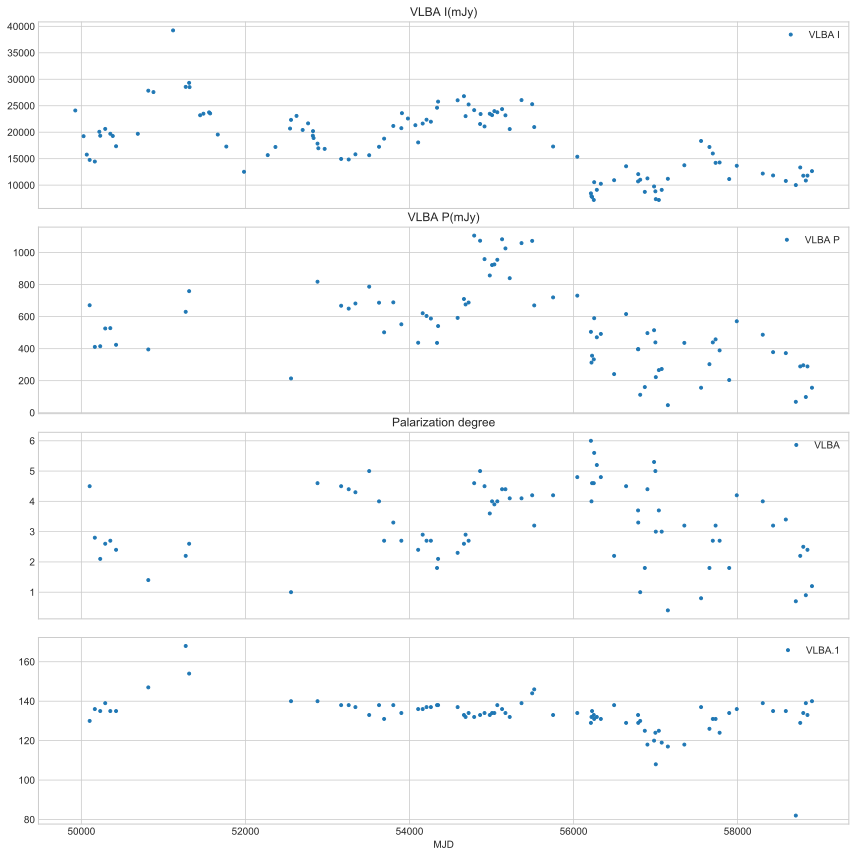

In [314]:
fig, axs = plt.subplots(4, 1,sharex=True,figsize=(12,12))
for i in range(4):
    label=mojave_15GHz_data.columns[i+2]
    print(label)
    mojave_15GHz_data_plot=mojave_15GHz_data[mojave_15GHz_data[label].notnull()]
    axs[i].errorbar(mojave_15GHz_data_plot['mjd'],mojave_15GHz_data_plot[label],fmt='.')
    axs[i].legend()
    
    
axs[0].set_title('VLBA I(mJy)')
axs[1].set_title('VLBA P(mJy)')
axs[2].set_title('Palarization percentage')
axs[2].set_title('Palarization degree')

plt.xlabel('MJD')
plt.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.savefig('/Users/brettlv/Downloads/mojave15Ghz.png',dpi=400)
    
    
    #plt.show()

## wise

In [30]:
data_allwise_epoch=pd.read_csv('/Users/brettlv/Downloads/3C273/allwise_multi_epoch.csv')
data_neowise=pd.read_csv('/Users/brettlv/Downloads/3C273/neowise_3c273.csv')

In [ ]:
data_allwise_epoch.columns,data_neowise.columns

mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise


Text(0, 0.5, 'magnitude')

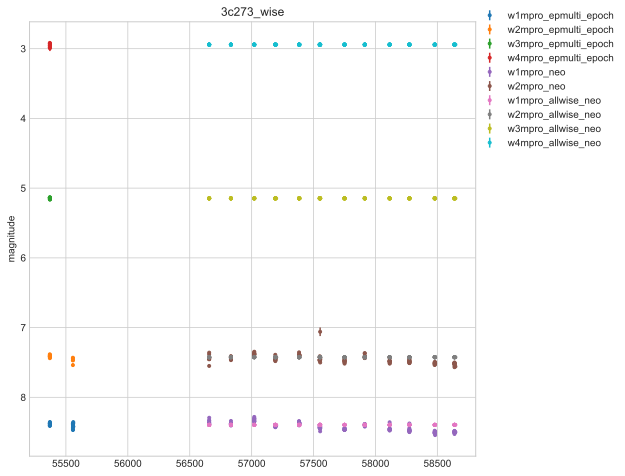

In [37]:
fig, axs = plt.subplots(1, 1,figsize=(8,8))
axs.set_title('3c273_wise')

for i in range(4):
    name_mjd='mjd'
    name_band=data_allwise_epoch.columns[i*3+8]
    name_err=data_allwise_epoch.columns[i*3+9]
    print(name_mjd,name_band,name_err)
    data_band=data_allwise_epoch[data_allwise_epoch[name_mjd].notnull()]  
    axs.errorbar(data_band[name_mjd],data_band[name_band],data_band[name_err],fmt='.',label=name_band+'multi_epoch')
    dcf_wise_data=pd.DataFrame({'t':data_band[name_mjd],'flux':data_band[name_band],'err':data_band[name_err]},index=None,columns=['t','flux','err'])
    dcf_wise_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_wise_multi_%s_data.csv'%name_band,index=False,header=False)


data_neowise_select=data_neowise.loc[:, ['w1mpro', 'w1sigmpro',
         'w2mpro', 'w2sigmpro','w1mpro_allwise', 'w1sigmpro_allwise', 'w2mpro_allwise',
        'w2sigmpro_allwise', 'w3mpro_allwise', 'w3sigmpro_allwise',
        'w4mpro_allwise', 'w4sigmpro_allwise']]

for i in range(6):
    name_mjd='mjd'
    name_band=data_neowise_select.columns[i*2]
    name_err=data_neowise_select.columns[i*2+1]
    print(name_mjd,name_band,name_err)
    axs.errorbar(data_neowise[name_mjd],data_neowise_select[name_band],data_neowise_select[name_err],fmt='.',label=name_band+'_neo')
    axs.set_ylabel('magnitude')  
    dcf_neowise_data=pd.DataFrame({'t':data_neowise[name_mjd],'flux':data_neowise[name_band],'err':data_neowise[name_err]},index=None,columns=['t','flux','err'])
    dcf_neowise_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_neowise_%s_data.csv'%name_band,index=False,header=False)

axs.legend(loc=[1.0,0.7])
axs.invert_yaxis()
axs.set_ylabel('magnitude')

## zhang2019

   1- 10 F10.2  d                  JD1       ?="" Julian Date of Spectra
  12- 16 F5.2   10-15mW/m2/0.1nm   F5100     ?="" continuum flux at 5100A, 10−15 erg/s/cm2/A
  18- 21 F4.2   10-15mW/m2/0.1nm e_F5100     ?="" Uncertainty in F5100
  23- 27 F5.2   10-13mW/m2         F-Hbeta   ?="" H{beta} emission-line flux, 10−13 erg/s/cm2
  29- 32 F4.2   10-13mW/m2       e_F-Hbeta   ?="" Uncertainty in F-Hbeta
  34- 37 F4.2   10-13mW/m2         F-Hgamma  ?="" H{gamma} emission-line flux
  39- 42 F4.2   10-13mW/m2       e_F-Hgamma  ?="" Uncertainty in F-Hgamma
  44- 48 F5.2   10-13mW/m2         F-Fe      ?="" Fe emission-line flux
  50- 53 F4.2   10-13mW/m2       e_F-Fe      ?="" Uncertainty in F-Fe
  55- 55 A1     ---                Obs1      ?="" Spectrum Observatory (1)
  57- 66 F10.2  d                  JD2       Julian Date of V band photometry
  68- 72 F5.2   mag                Vmag      V band magnitude
  74- 77 F4.2   mag              e_Vmag      Uncertainty in Vmag
  79- 79 A1     ---                Obs2      Photometry Observatory (1)
--------------------------------------------------------------------------------
Note (1): Observatory codes for spectrum and photometric monitoring --
    S = Steward Observatory (SO) spectropolarimetric monitoring project1;
    L = Lijiang Observatory;
    A = All-Sky Automated Survey for Supernovae (ASAS-SN) project.

In [32]:
data_3c273_zhang=pd.read_csv('/Users/brettlv/Downloads/3C273/zhang_3c273.txt',delimiter='\s',skiprows=range(30),header=None)#
data_3c273_zhang.columns=['jd_spectra','f_5100','ferr_5100','Hbeta','ferr_Hbeta','Hgamma','ferr_Hgamma','Fe','ferr_Fe','Obs_spectra','jd_V','V','ferr_V','Obs_photometry']

/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  if __name__ == '__main__':


In [33]:
data_3c273_zhang_line=data_3c273_zhang.loc[:, ['jd_spectra','f_5100','ferr_5100','Hbeta','ferr_Hbeta','Hgamma','ferr_Hgamma','Fe','ferr_Fe']]
data_3c273_zhang_line['mjd']=data_3c273_zhang_line['jd_spectra']-2400000.5
data_3c273_zhang_V=data_3c273_zhang.loc[:, ['jd_V','V','ferr_V']]
data_3c273_zhang_V['mjd']=data_3c273_zhang['jd_V']-2400000.5

data_3c273_zhang_part2=pd.read_csv('/Users/brettlv/Downloads/3C273/zhang_3c273_part2.txt',delimiter='\s+',header=None)#
print(data_3c273_zhang_part2.columns)
data_3c273_zhang_part2.columns=['jd_V','V','ferr_V','S']
print(data_3c273_zhang_part2.columns)
data_3c273_zhang_part2['mjd']=data_3c273_zhang_part2['jd_V']-2400000.5
data_3c273_zhang_V_all=pd.concat([data_3c273_zhang_V,data_3c273_zhang_part2],ignore_index=True)


Int64Index([0, 1, 2, 3], dtype='int64')
Index(['jd_V', 'V', 'ferr_V', 'S'], dtype='object')


/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:11: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [62]:
data_3c273_zhang_line

,jd_spectra,f_5100,ferr_5100,Hbeta,ferr_Hbeta,Hgamma,ferr_Hgamma,Fe,ferr_Fe,mjd
0,2454795.02,21.75,0.27,18.17,0.24,6.93,0.13,14.95,0.28,54794.52
1,2454800.99,22.95,0.28,18.27,0.25,6.70,0.16,15.41,0.34,54800.49
2,2454802.99,24.09,0.27,18.00,0.23,6.27,0.12,15.11,0.27,54802.49
3,2454803.97,22.28,0.27,16.92,0.23,5.90,0.11,14.41,0.25,54803.47
4,2454828.98,20.40,0.27,17.64,0.23,6.02,0.11,14.93,0.24,54828.48
5,2454829.96,19.89,0.27,17.64,0.24,6.30,0.13,14.87,0.28,54829.46
6,2454830.96,20.52,0.27,17.68,0.23,5.86,0.13,15.11,0.28,54830.46
7,2454831.96,19.75,0.27,17.58,0.24,6.08,0.13,14.94,0.29,54831.46
8,2454832.96,19.68,0.27,17.38,0.23,6.14,0.12,14.77,0.26,54832.46
9,2454860.94,20.00,0.27,17.27,0.24,6.10,0.13,14.55,0.29,54860.44


In [40]:
dcf_data_3c273_zhang_V_all=pd.DataFrame({'t':data_3c273_zhang_V_all['mjd'],'flux':data_3c273_zhang_V_all['V'],'err':data_3c273_zhang_V_all['ferr_V']},index=None,columns=['t','flux','err'])
dcf_data_3c273_zhang_V_all.to_csv('/Users/brettlv/Downloads/3C273/dcf_data_3c273_zhang_V_all.csv',index=False,header=False)


### plot line

mjd f_5100 ferr_5100
mjd Hbeta ferr_Hbeta
mjd Hgamma ferr_Hgamma
mjd Fe ferr_Fe


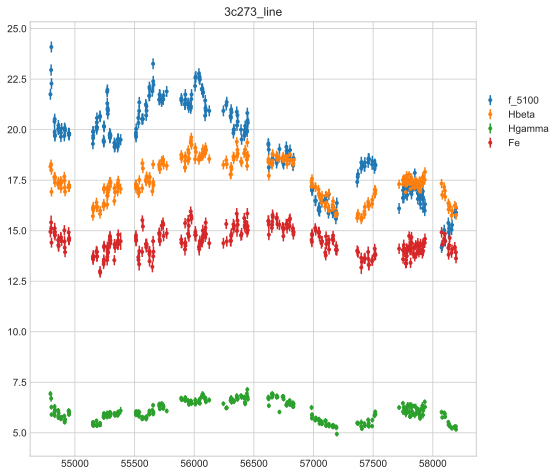

In [70]:
fig, axs = plt.subplots(1, 1,figsize=(8,8))
axs.set_title('3c273_line')

''' if name_band=='f_5100':        
        dcf_line_data=pd.DataFrame({'t':data_3c273_zhang_line[name_mjd],'flux':data_3c273_zhang_line[name_band]*1.0e-2,'err':data_3c273_zhang_line[name_err]*1.0e-2},index=None,columns=['t','flux','err'])        
    else:
'''
for i in range(4):
    name_mjd='mjd'
    name_band=data_3c273_zhang_line.columns[i*2+1]
    name_err=data_3c273_zhang_line.columns[i*2+2]
    print(name_mjd,name_band,name_err)
    dcf_line_data=pd.DataFrame({'t':data_3c273_zhang_line[name_mjd],'flux':data_3c273_zhang_line[name_band],'err':data_3c273_zhang_line[name_err]},index=None,columns=['t','flux','err'])        
    dcf_line_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_%s_data.csv'%name_band,index=False,header=False)
    #plt.errorbar(data_3c273_zhang_line[name_mjd],data_3c273_zhang_line[name_band],data_3c273_zhang_line[name_err],fmt='.',label=name_band)
    plt.errorbar(dcf_line_data['t'],dcf_line_data['flux'],dcf_line_data['err'],fmt='.',label=name_band)
axs.legend(loc=[1.0,0.7])
#axs.set_yscale('log')


## MAXI

In [41]:
MAXI_week=pd.read_csv('/Users/brettlv/Downloads/3C273/J1229+020_weekbin_ge4days.txt',delimiter=',',header=None)

In [42]:
MAXI_week.columns=['mjd','2-20','err2-20','2-4','err2-4','4-10','err4-10','10-20','err10-20','n1','n2']

<ErrorbarContainer object of 3 artists>

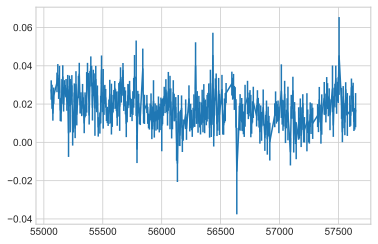

In [43]:
plt.errorbar(MAXI_week['mjd'],MAXI_week['2-20'],MAXI_week['err2-20'])

In [44]:
dcf_data_MAXI_week=pd.DataFrame({'t':MAXI_week['mjd'],'flux':MAXI_week['2-20'],'err':MAXI_week['err2-20']},index=None,columns=['t','flux','err'])
dcf_data_MAXI_week.to_csv('/Users/brettlv/Downloads/3C273/dcf_MAXI3c273week_2-20keV.csv',index=False,header=False)

dcf_data_MAXI_week=pd.DataFrame({'t':MAXI_week['mjd'],'flux':MAXI_week['2-4'],'err':MAXI_week['err2-4']},index=None,columns=['t','flux','err'])
dcf_data_MAXI_week.to_csv('/Users/brettlv/Downloads/3C273/dcf_MAXI3c273week_2-4keV.csv',index=False,header=False)



dcf_data_MAXI_week=pd.DataFrame({'t':MAXI_week['mjd'],'flux':MAXI_week['4-10'],'err':MAXI_week['err4-10']},index=None,columns=['t','flux','err'])
dcf_data_MAXI_week.to_csv('/Users/brettlv/Downloads/3C273/dcf_MAXI3c273week_4-10keV.csv',index=False,header=False)


dcf_data_MAXI_week=pd.DataFrame({'t':MAXI_week['mjd'],'flux':MAXI_week['10-20'],'err':MAXI_week['err10-20']},index=None,columns=['t','flux','err'])
dcf_data_MAXI_week.to_csv('/Users/brettlv/Downloads/3C273/dcf_MAXI3c273week_10-20keV.csv',index=False,header=False)



MAXI_week_rescale_2_20keV=(MAXI_week['2-20']-min(MAXI_week['2-20']))/(max(MAXI_week['2-20'])-min(MAXI_week['2-20']))# rescale to 0-1
MAXI_err_week_rescale=MAXI_week['err2-20']*MAXI_week_rescale_2_20keV/MAXI_week['2-20']
dcf_data_MAXI_week_rescale=pd.DataFrame({'t':MAXI_week['mjd'],'flux':MAXI_week_rescale_2_20keV,'err':MAXI_err_week_rescale},index=None,columns=['t','flux','err'])
dcf_data_MAXI_week_rescale.to_csv('/Users/brettlv/Downloads/3C273/dcf_MAXI3c273week_rescale.csv',index=False,header=False)

mjd 2-20 err2-20


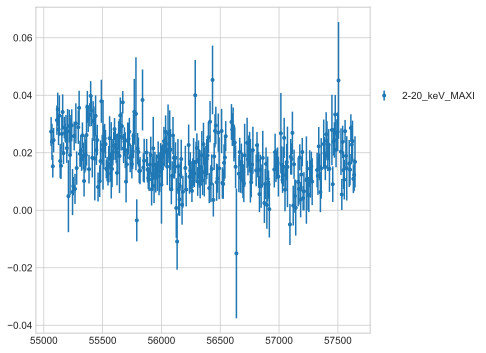

In [45]:
fig, axs = plt.subplots(1, 1,sharex=True,figsize=(6,6))
for i in range(1):
    name_mjd='mjd'
    name_band=MAXI_week.columns[i*2+1]
    name_err=MAXI_week.columns[i*2+2]
    print(name_mjd,name_band,name_err)
    axs.errorbar(MAXI_week[name_mjd],MAXI_week[name_band],MAXI_week[name_err],fmt='.',label=name_band+'_keV_MAXI')   
axs.legend(loc=[1.0,0.7])

mjd 2-20 err2-20
mjd 2-4 err2-4
mjd 4-10 err4-10
mjd 10-20 err10-20


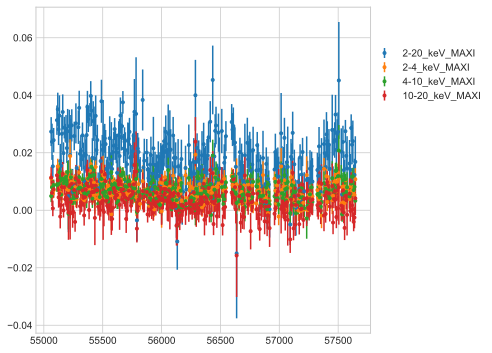

In [47]:
fig, axs = plt.subplots(1, 1,sharex=True,figsize=(6,6))
for i in range(4):
    name_mjd='mjd'
    name_band=MAXI_week.columns[i*2+1]
    name_err=MAXI_week.columns[i*2+2]
    print(name_mjd,name_band,name_err)
    axs.errorbar(MAXI_week[name_mjd],MAXI_week[name_band],MAXI_week[name_err],fmt='.',label=name_band+'_keV_MAXI')   
axs.legend(loc=[1.0,0.7])

mjd 2-20 err2-20
mjd 2-4 err2-4
mjd 4-10 err4-10
mjd 10-20 err10-20


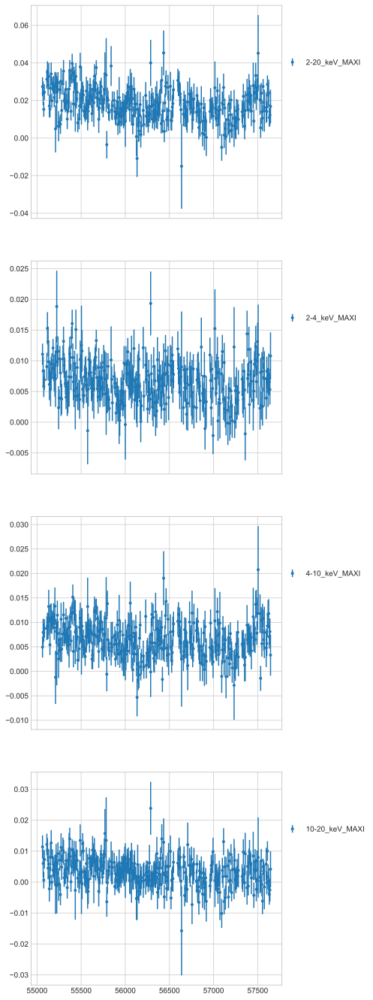

In [46]:
fig, axs = plt.subplots(4, 1,sharex=True,figsize=(6,24))
for i in range(4):
    name_mjd='mjd'
    name_band=MAXI_week.columns[i*2+1]
    name_err=MAXI_week.columns[i*2+2]
    print(name_mjd,name_band,name_err)
    axs[i].errorbar(MAXI_week[name_mjd],MAXI_week[name_band],MAXI_week[name_err],fmt='.',label=name_band+'_keV_MAXI')   
    axs[i].legend(loc=[1.0,0.7])

## BAT

In [256]:
bat_path='/Users/brettlv/Downloads/3C273/3C273.lc.fits'#BAT
lightcurve_bat=pyfits.open(bat_path)

In [257]:
lightcurve_bat.info()

Filename: /Users/brettlv/Downloads/3C273/3C273.lc.fits
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU       6   ()              
1    RATE        BinTableHDU     77   4864R x 11C   [1J, 1D, 1D, 1I, 1J, 1D, 1D, 1I, 1D, 1D, 1D]   


In [258]:
lightcurve_bat[1].columns

ColDefs(
    name = 'TIME'; format = '1J'; unit = 'd'
    name = 'RATE'; format = '1D'; unit = 'count/cm^2/s'
    name = 'ERROR'; format = '1D'; unit = 'count/cm^2/s'
    name = 'YEAR'; format = '1I'; unit = 'yr'
    name = 'DAY'; format = '1J'; unit = 'd'
    name = 'STAT_ERR'; format = '1D'; unit = 'count/cm^2/s'
    name = 'SYS_ERR'; format = '1D'; unit = 'count/cm^2/s'
    name = 'DATA_FLAG'; format = '1I'
    name = 'TIMEDEL_EXPO'; format = '1D'; unit = 's'
    name = 'TIMEDEL_CODED'; format = '1D'; unit = 's'
    name = 'TIMEDEL_DITHERED'; format = '1D'; unit = 's'
)

lightcurve_bat[1].data['TIME']

In [250]:
lightcurve_bat[1].data['RATE'][0]>0

False

In [261]:
dcf_bat_data=pd.DataFrame({'t':lightcurve_bat[1].data['TIME'],'flux':lightcurve_bat[1].data['RATE'],'err':lightcurve_bat[1].data['ERROR']},index=None,columns=['t','flux','err'])
dcf_bat_data

,t,flux,err
0,53416,-0.000394,0.000793
1,53417,-0.000503,0.000578
2,53418,-0.000144,0.000980
3,53419,0.002951,0.000971
4,53420,-0.001615,0.002086
5,53421,-0.002127,0.001940
6,53422,-0.000149,0.001945
7,53423,0.001634,0.002057
8,53432,0.000286,0.001834
9,53433,0.000709,0.000951


In [262]:
dcf_bat_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_bat_data.csv',index=False,header=False)

## XRT

In [238]:
data_3c273_xrt=pd.read_csv('/Users/brettlv/Downloads/3C273/lightcurve_xrt_3C273.txt',delimiter='\s+',skiprows=range(23),header=None)#
data_3c273_xrt.columns=['mjd','BinHW','flux','err','FracExp','mode']

data_3c273_xrt#3-10keV

In [240]:
dcf_xrt_data=pd.DataFrame({'t':data_3c273_xrt['mjd'],'flux':data_3c273_xrt['flux'],'err':data_3c273_xrt['err']},index=None,columns=['t','flux','err'])
dcf_xrt_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_xrt_data.csv',index=False,header=False)


## RXTE

In [ ]:
## 2-10 keV PCA Flux light curve for  3C 273
## Note: Re-analyzed Oct. 2013 with 2011 bkgd models
## Fits over 3.3-23 keV band. Gamma, A1, I_Fe free; all other parameters frozen at time-avg. values 
## Col. 1: MJD midpoint of observation
## Col. 2-3: 2-10 keV Flux and Uncertainty
## Col. 4: Good exposure term of ObsID (sec)

In [91]:
data_3c273_rxte=pd.read_csv('/Users/brettlv/Downloads/3C273/F0210_3C273.txt',delimiter='\s+',skiprows=range(6),header=None)#
data_3c273_rxte.columns=['mjd','flux','err','exposure']

In [173]:
dcf_data_3c273_rxte=pd.DataFrame({'t':data_3c273_rxte['mjd'],'flux':data_3c273_rxte['flux'],'err':data_3c273_rxte['err']},index=None,columns=['t','flux','err'])
dcf_data_3c273_rxte.to_csv('/Users/brettlv/Downloads/3C273/dcf_data_3c273_rxte.csv',index=False,header=False)

dcf_data_3c273_rxte_e10=pd.DataFrame({'t':data_3c273_rxte['mjd'],'flux':data_3c273_rxte['flux']*1e10,'err':data_3c273_rxte['err']*1e10},index=None,columns=['t','flux','err'])
dcf_data_3c273_rxte_e10.to_csv('/Users/brettlv/Downloads/3C273/dcf_e10_rxte.csv',index=False,header=False)


In [92]:
data_3c273_rxte

,mjd,flux,err,exposure
0,50115.060567,1.522000e-10,1.700000e-12,224.0
1,50122.613160,1.408000e-10,1.290000e-12,320.0
2,50133.116586,1.708000e-10,4.843000e-12,80.0
3,50137.722419,2.136000e-10,1.433000e-12,576.0
4,50143.863437,1.800000e-10,2.912000e-12,208.0
5,50148.556956,1.662000e-10,1.316000e-12,560.0
6,50155.139549,1.463000e-10,1.518000e-12,336.0
7,50164.214178,1.535000e-10,1.233000e-12,528.0
8,50187.430567,1.056000e-10,7.307000e-13,608.0
9,50194.236586,8.834000e-11,1.010000e-12,656.0


# plot_all

In [284]:
#plt.errorbar(data_gamma_day['t'],data_plot_gamma_day['flux'],data_plot_gamma_day['err'],fmt='.',label='gammaday')
from matplotlib.ticker import (
                               AutoLocator, AutoMinorLocator)
import matplotlib.ticker as ticker

fig = plt.figure(figsize=(3, 3))
ax=fig.add_subplot(211)

#fig, axs = plt.subplots(7, 1,sharex=True,figsize=(24,48))


data_plot=data_gamma_week
axs[0].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='Fermi_week')
print('Fermi',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))

###
#MAXI
data_plot=pd.DataFrame({'t':MAXI_week['mjd'],'flux':MAXI_week['2-20'],'err':MAXI_week['err2-20']},index=None,columns=['t','flux','err'])
axs[1].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='MAXI_week_2-20keV')
print('MAXI',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))



data_plot=dcf_bat_data
axs[1].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='BAT')
print('BAT',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))



data_plot=dcf_xrt_data
axs[1].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='XRT')
print('XRT',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))

####radio
data_plot=dcf_sma_1mm
axs[3].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='sma_1mm')
print('sma1mm',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))


data_plot=dcf_sma_850
axs[3].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='sma_850')
print('sma850',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))

data_plot=dcf_ovro_40m_data
axs[3].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='ovro_40m')
print('ovro40m',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))

data_plot=dcf_alma_data
axs[3].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='alma100GHz')
data_plot=dcf_butot_data
axs[3].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='VLBA43GHz')
print('alma',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))

data_plot=dcf_mojave_15GHz_data
axs[3].errorbar(data_plot['t'],data_plot['flux'],data_plot['err'],fmt='.',label='mojave_15GHz')
print('mojave15Ghz',int(min(data_plot['t'])),int(max(data_plot['t']))+1,(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1),(int(max(data_plot['t']))-int(min(data_plot['t'])))/(len(data_plot['t'])-1))


####
#line zhang
for i in range(4):
    name_mjd='mjd'
    name_band=data_3c273_zhang_line.columns[i*2+1]
    name_err=data_3c273_zhang_line.columns[i*2+2]
    print(name_mjd,name_band,name_err)
    if name_band=='f_5100':
        axs[4].errorbar(data_3c273_zhang_line[name_mjd],data_3c273_zhang_line[name_band]*1.0e-15,data_3c273_zhang_line[name_err]*1.0e-15,fmt='.',label=name_band)
    else:
        axs[4].errorbar(data_3c273_zhang_line[name_mjd],data_3c273_zhang_line[name_band]*1.0e-13,data_3c273_zhang_line[name_err]*1.0e-13,fmt='.',label=name_band)
######

######

for i in range(5):
    name_jd=data_smarts.columns[i*3+1]
    name_band=data_smarts.columns[i*3+2]
    name_err=data_smarts.columns[i*3+3]
    #print(name_mjd,name_band,name_err)
    data_band=data_smarts[data_smarts[name_jd]!=999.0]
    axs[5].errorbar(data_band[name_jd]-2400000.5,data_band[name_band],data_band[name_err],fmt='.',label=name_band+'_smarts')
    axs[5].set_ylabel('magnitude')
data_plot=data_V_all
axs[5].errorbar(data_plot['mjd'],data_plot['V'],data_plot['σ(V)'],fmt='.',label='V_filter')
data_plot=data_R_all
axs[5].errorbar(data_plot['mjd'],data_plot['R'],data_plot['σ(R)'],fmt='.',label='R_filter')
# V zhang 'mjd','V','ferr_V'
axs[5].errorbar(data_3c273_zhang_V_all['mjd'],data_3c273_zhang_V_all['V'],data_3c273_zhang_V_all['ferr_V'],fmt='.',label='V_zhang2019')
#data_3c273_zhang_V




####wise

for i in range(4):
    name_mjd='mjd'
    name_band=data_allwise_epoch.columns[i*3+8]
    name_err=data_allwise_epoch.columns[i*3+9]
    print(name_mjd,name_band,name_err)
    data_band=data_allwise_epoch[data_allwise_epoch[name_mjd].notnull()]
    axs[6].errorbar(data_band[name_mjd],data_band[name_band],data_band[name_err],fmt='.',label=name_band+'_multi_epoch')


data_neowise_select=data_neowise.loc[:, ['w1mpro', 'w1sigmpro',
                                         'w2mpro', 'w2sigmpro','w1mpro_allwise', 'w1sigmpro_allwise', 'w2mpro_allwise',
                                         'w2sigmpro_allwise', 'w3mpro_allwise', 'w3sigmpro_allwise',
                                         'w4mpro_allwise', 'w4sigmpro_allwise']]
for i in range(6):
    name_mjd='mjd'
    name_band=data_neowise_select.columns[i*2]
    name_err=data_neowise_select.columns[i*2+1]
    print(name_mjd,name_band,name_err)
    axs[6].errorbar(data_neowise[name_mjd],data_neowise_select[name_band],data_neowise_select[name_err],fmt='.',label=name_band+'_neo')


axs[2].errorbar(data_3c273_rxte['mjd'],data_3c273_rxte['flux'],data_3c273_rxte['err'],fmt='.',label='RXTE_2-10keV')


for i in range(7):
    axs[i].xaxis.set_minor_locator(AutoMinorLocator())
    axs[i].legend(loc=[1.0,0.7])
    axs[i].set_xticks(np.arange(52000,59100,500),minor=True)
    axs[i].get_xaxis().set_visible(True)
    axs[i].set_xlim(50000,59500)

axs[0].set_ylabel('Count rate')
axs[1].set_ylabel('Count rate')
axs[3].set_ylabel('Jy')

axs[4].set_ylabel('flux')
axs[2].set_ylabel('flux')

axs[5].set_ylabel('magnitude')
axs[6].set_ylabel('magnitude')
axs[6].invert_yaxis()
axs[5].invert_yaxis()



axs[0].set_title('3c273_fermi')
axs[1].set_title('3c273_MAXI')
axs[2].set_title('3c273_rxte')
axs[3].set_title('3c273_Radio')
axs[4].set_title('3c273_emission_line')
axs[5].set_title('3c273_optical')
axs[6].set_title('3c273_wise')


axs[0].set_yscale('log')
axs[1].set_yscale('log')
axs[1].set_ylim(0,50)
axs[4].set_yscale('log')

plt.xlabel('MJD')
fig.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.savefig('/Users/brettlv/Downloads/3C273_multi_band_lc_l.pdf',dpi=400)
#plt.semilogy()



Fermi 54684 58981
MAXI 55062 57646
BAT 53416 58995
XRT 53417 58902
sma1mm 52657 58655
sma850 52431 58064
ovro40m 54473 58874
alma 57067 58462
mojave15Ghz 49926 58908
mjd f_5100 ferr_5100
mjd Hbeta ferr_Hbeta
mjd Hgamma ferr_Hgamma
mjd Fe ferr_Fe
mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise


/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:150: UserWarning:

Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.



# get_new_range_data

In [328]:
def get_data(path):    
    data=pd.read_csv(path,header=None)
    return data

def get_lc_data(data):    
    t1,dy1,y_obs1= (data[0],data[2],data[1]) 
    return t1,dy1,y_obs1

def get_new_range_data(t,dy,y_obs,rangemin,rangemax):
    
    t1new,dy1new,y_obs1new=t[t>=rangemin],dy[t>=rangemin],y_obs[t>=rangemin]
    t2new,dy2new,y_obs2new=t1new[t<=rangemax],dy1new[t<=rangemax],y_obs1new[t<=rangemax]   
    return t2new,dy2new,y_obs2new

#def plot_new_data(t1,dy1,y_obs1,t2,dy2,y_obs2):



def write_dcf_data(t1,dy1,y_obs1,t2,dy2,y_obs2):    
    dcf_data_write1=pd.DataFrame({'t':t1,'flux':y_obs1,'err':dy1},index=None,columns=['t','flux','err'])
    dcf_data_write1.to_csv(newfile1,index=False,header=False)
    dcf_data_write2=pd.DataFrame({'t':t2,'flux':y_obs2,'err':dy2},index=None,columns=['t','flux','err'])
    dcf_data_write2.to_csv(newfile2,index=False,header=False)




ls /Users/brettlv/Downloads/3C273/dcf_* 

# px light_curve

In [266]:
import plotly_express as px

In [268]:
min(dcf_data_gamma_week['t']),max(dcf_data_gamma_week['t'])

(54684.00074287037, 58980.00074287037)

In [270]:
min(dcf_data_3c273_rxte_e10['t']),max(dcf_data_3c273_rxte_e10['t'])

(50115.060567, 55926.560359)

In [271]:
min(dcf_sma_1mm['t']),max(dcf_sma_1mm['t'])

(52657.27291666667, 58654.30138888889)

In [272]:
min(dcf_sma_850['t']),max(dcf_sma_850['t'])

(52431.0, 58063.79236111111)

In [279]:
min(dcf_xrt_data['t']),max(dcf_xrt_data['t'])

(53417.75613, 58901.475338)

In [ ]:
min(dcf_xrt_data['t']),max(dcf_xrt_data['t'])





In [267]:

fig = px.scatter(dcf_data_gamma_week, x='t',y='flux',error_y='err',
           hover_name="t",hover_data=['flux'],size_max=15,)


fig.update_xaxes(tickformat= "0.1d",nticks=4,type="linear",title_text="")
fig.update_yaxes(tickformat= "0.2f",nticks=10,type="log",title_text="LC_Fermi")
fig.update_layout(title_text="", width = 800,height = 600)
#fig.update_xaxes(range=[np.log10(2e-4),np.log10(1e-2)])
#fig.update_yaxes(range=[1.0,2.5])
fig.show()
#fig.write_image('xray-paper-g-eddrate.gif')
#fig.write_image('xray-paper-g-eddrate.png')
#fig.write_html('LC_Fermi.html')

# timelag

## e7_gamma_sma_1mm

In [506]:
path1='/Users/brettlv/Downloads/3C273/dcf_e7_gamma3c273week.csv'
path2='/Users/brettlv/Downloads/3C273/dcf_sma_1mm.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
#rangemin,rangemax=(54684, 58654)
#rangemin,rangemax=(57000, 58654)
#rangemin,rangemax=(54684, 57000)
rangemin,rangemax=(54684, 55500)

data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)
newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s -500 500 30.0 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))




0

In [478]:
data=np.loadtxt(path1, comments='#', delimiter=',')

In [481]:
data[:,0].size

604

In [482]:
min(data[:,0])

54684.00074287037

0

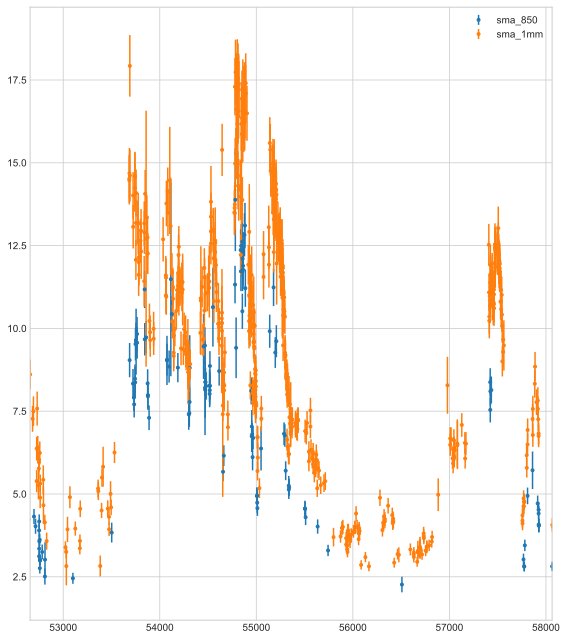

In [453]:
path1='/Users/brettlv/Downloads/3C273/dcf_sma_850.csv'
path2='/Users/brettlv/Downloads/3C273/dcf_sma_1mm.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]

rangemin,rangemax=(52657, 58064)

data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(0,figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
#plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)
newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s -100 100 20.0 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))



0

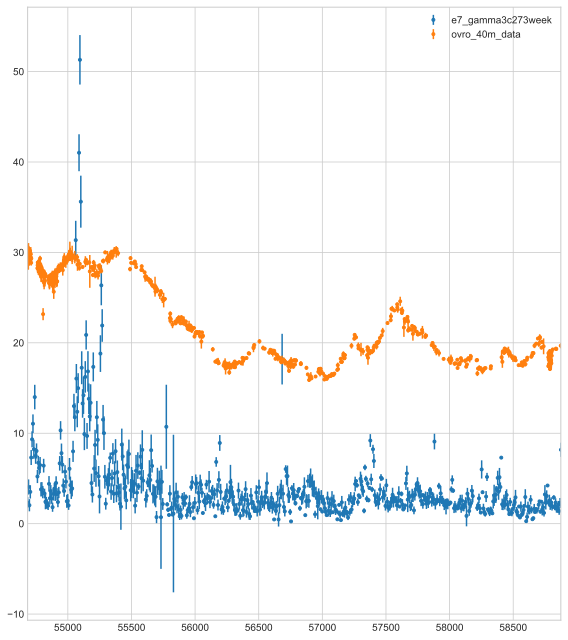

In [450]:
path1='/Users/brettlv/Downloads/3C273/dcf_e7_gamma3c273week.csv'
path2='/Users/brettlv/Downloads/3C273/dcf_ovro_40m_data.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
#rangemin,rangemax=(54684, 58654)
#rangemin,rangemax=(57000, 58654)
#rangemin,rangemax=(54684, 57000)
rangemin,rangemax=(54684, 58874)

data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
#plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)
newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s 0 500 40.0 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))



## rxte_sma1mm

0

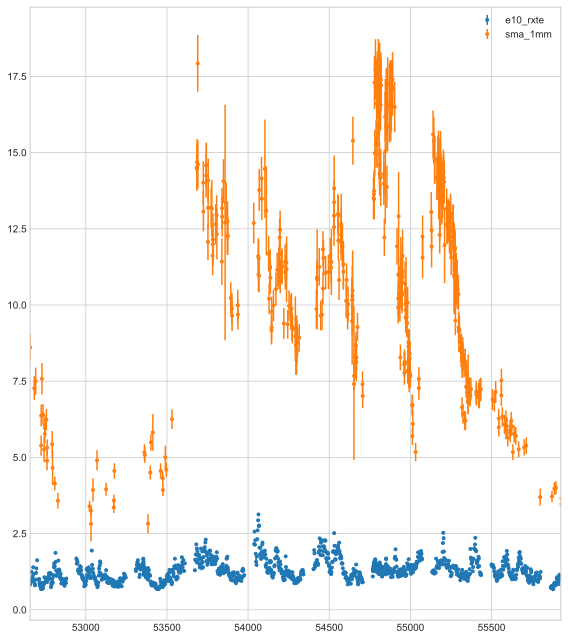

In [277]:
path1='/Users/brettlv/Downloads/3C273/dcf_e10_rxte.csv'
path2='/Users/brettlv/Downloads/3C273/dcf_sma_1mm.csv'#
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
rangemin,rangemax=(52657,55927)
data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
#plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)

newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s -500 500 1.0 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))

## gamma_rxte

0

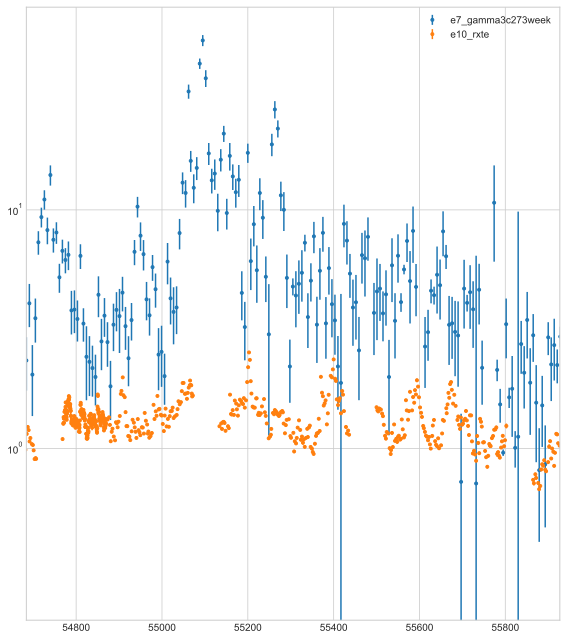

In [278]:
path1='/Users/brettlv/Downloads/3C273/dcf_e7_gamma3c273week.csv'#54680., 58990
path2='/Users/brettlv/Downloads/3C273/dcf_e10_rxte.csv'#50110, 55930
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
rangemin,rangemax=(54684,55927)#
data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)

newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s -300 300 1.0 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))

## gamma_xrt

0

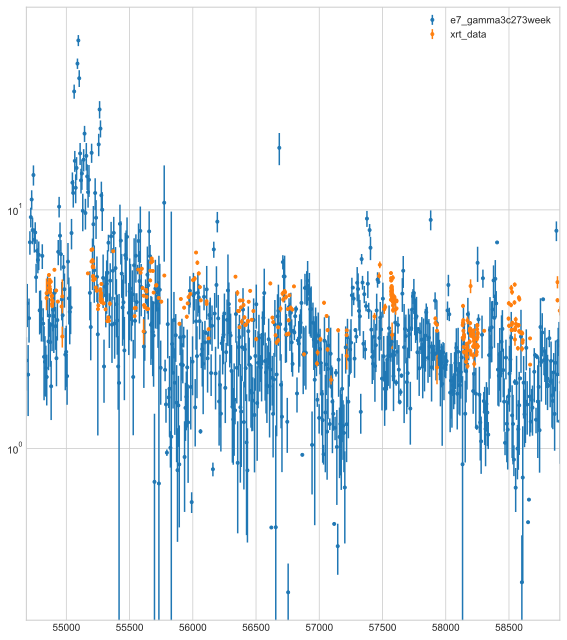

In [289]:
path1='/Users/brettlv/Downloads/3C273/dcf_e7_gamma3c273week.csv'
path2='/Users/brettlv/Downloads/3C273/dcf_xrt_data.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
rangemin,rangemax=(54684., 58902)
data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)
newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s -500 500 1.0 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))





## Line

### f_5100_Fe

0

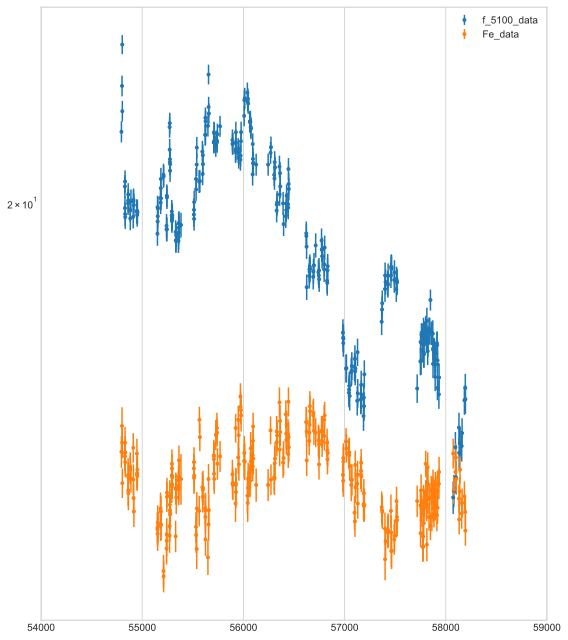

In [422]:
path1='/Users/brettlv/Downloads/3C273/dcf_f_5100_data.csv'
path2='/Users/brettlv/Downloads/3C273/dcf_Fe_data.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
rangemin,rangemax=(54000, 59000)
data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)
newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s 200 400 17.0 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))





### f_5100_Hbeta

0

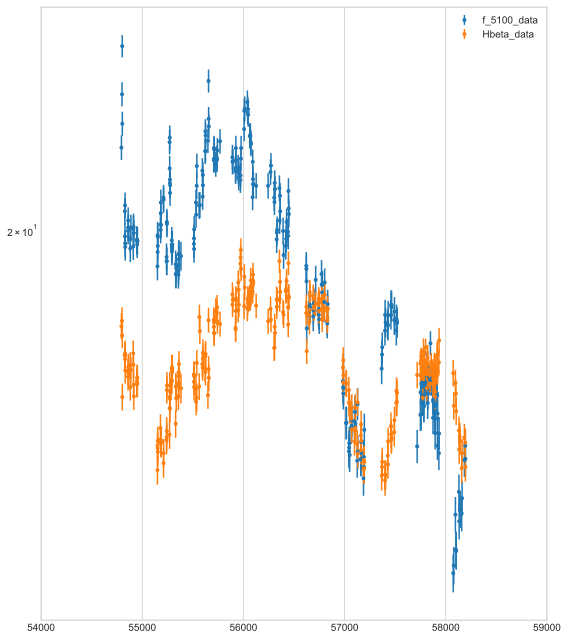

In [415]:
path1='/Users/brettlv/Downloads/3C273/dcf_f_5100_data.csv'
path2='/Users/brettlv/Downloads/3C273/dcf_Hbeta_data.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
rangemin,rangemax=(54000, 59000)
data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)
newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new) 
os.system('python dcf_test.py %s %s 100 200 10 %d %d -w=gauss -p=2 -o -v '%(newfile1,newfile2,rangemin,rangemax))

### f_5100_Hgamma

0

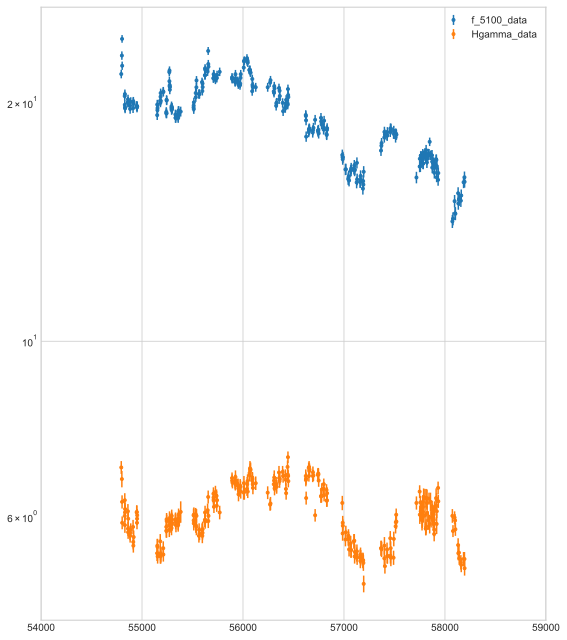

In [413]:
path1='/Users/brettlv/Downloads/3C273/dcf_f_5100_data.csv'
path2='/Users/brettlv/Downloads/3C273/dcf_Hgamma_data.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
rangemin,rangemax=(54000, 59000)
data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)
newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s 100 200 7.5 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))





In [ ]:
### test 

In [335]:
path1='/Users/brettlv/timing_analysis/pydcf/example/dcf_t1.csv'
path2='/Users/brettlv/timing_analysis/pydcf/example/dcf_t2.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
print(newpath1,newpath2)
rangemin,rangemax=(0, 20)
data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)

t1 t2


t1 t2


0

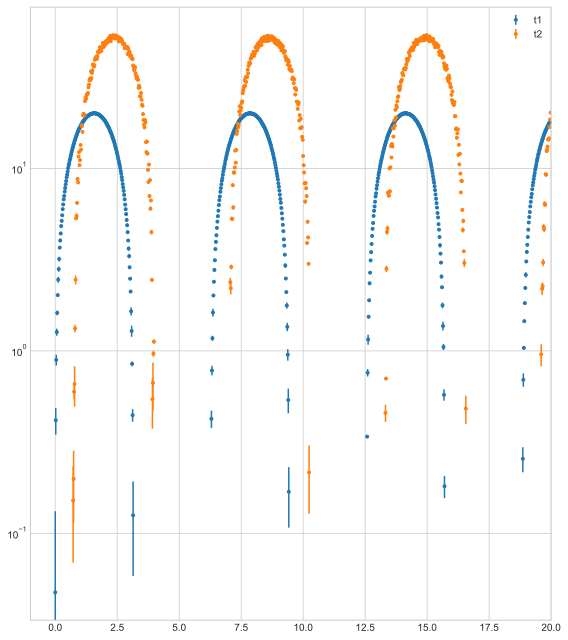

In [338]:
path1='/Users/brettlv/timing_analysis/pydcf/example/dcf_t1.csv'
path2='/Users/brettlv/timing_analysis/pydcf/example/dcf_t2.csv'
newpath1=path1.split('/')[-1][4:-4]
newpath2=path2.split('/')[-1][4:-4]
print(newpath1,newpath2)
rangemin,rangemax=(-1, 20)
data1=get_data(path1)
t1,dy1,y_obs1=get_lc_data(data1)
t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
data2=get_data(path2)
t2,dy2,y_obs2=get_lc_data(data2)
t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax)


plt.figure(figsize=(8,9))
plt.errorbar(t1,y_obs1,dy1,fmt='.',label=newpath1)
plt.errorbar(t2,y_obs2,dy2,fmt='.',label=newpath2)
plt.semilogy()
plt.legend()
plt.xlim(rangemin,rangemax)
plt.tight_layout()
plt.savefig('/Users/brettlv/timing_analysis/pydcf/%s_%s_time_%d_%d.png'%(newpath1,newpath2,rangemin,rangemax),dpi=300)


newfile1='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath1,newpath2)
newfile2='/Users/brettlv/Downloads/3C273/test/dcf_new_%s_%s.csv'%(newpath2,newpath1)
write_dcf_data(t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new)
os.system('python dcf_test.py %s %s -4 4 0.01 %d %d -w=gauss -p=2 -o '%(newfile1,newfile2,rangemin,rangemax))

